# Recognition tables with text 
variant 1

In [1]:
name_jpg = 'sample_3.jpg'

In [2]:
%matplotlib inline
import pytesseract
import cv2
import imutils
import numpy as np
import matplotlib.pyplot as plt
import copy

In [3]:
def show_image (img):
    plt.figure(figsize=(20,20))
    plt.imshow(img)
    plt.show()

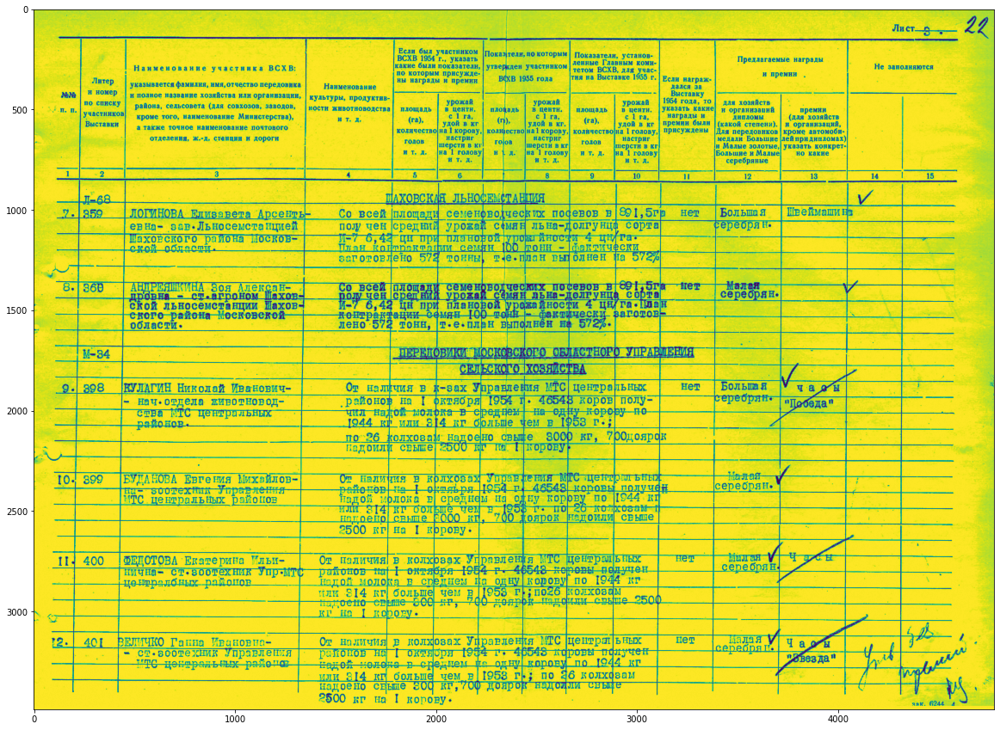

In [4]:
img = cv2.imread(name_jpg, 0)
show_image(img)

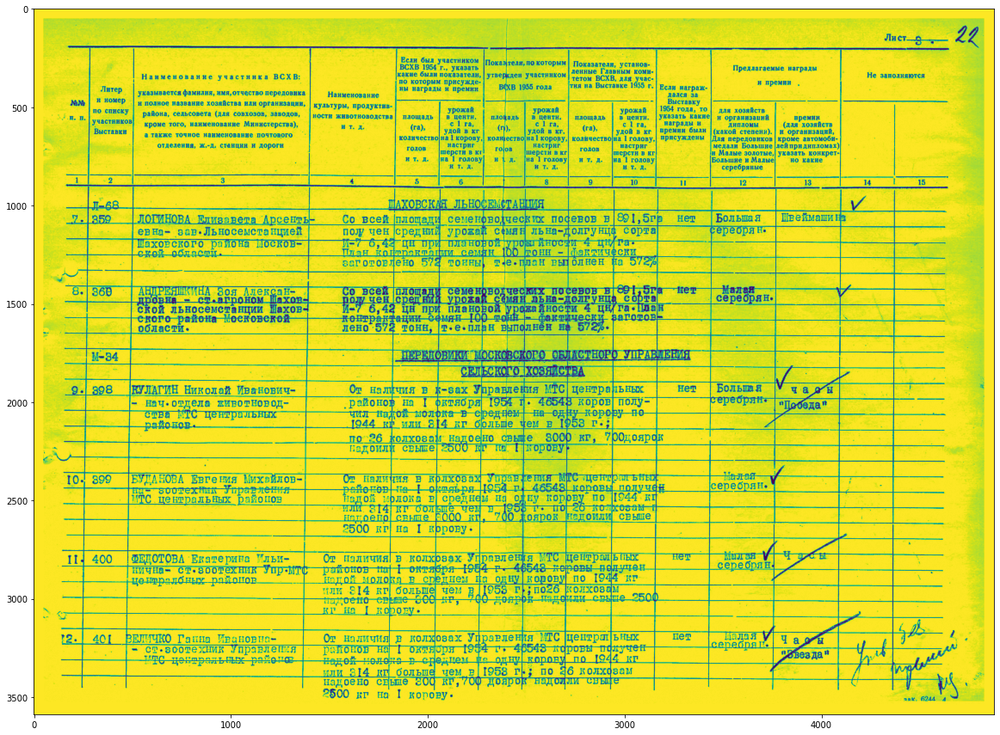

In [5]:
img1 = cv2.copyMakeBorder(
        img, 50, 50, 50, 50, cv2.BORDER_CONSTANT, value=[255, 255])
show_image(img1)

In [6]:
img123 = img1.copy()
# # Thresholding the image
(thresh, th3) = cv2.threshold(img123, 128, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
print(thresh)
# to flip image pixel values
th3 = 255 - th3

143.0


In [7]:
ver = np.array([[1],
                    [1],
                    [1],
                    [1],
                    [1],
                    [1],
                    [1],
                    [1],
                    [1],
                    [1],
                    [1],
                    [1],
                    [1],
                    [1],
                    [1],
                    [1],
                    [1],
                    [1],
                    [1]])

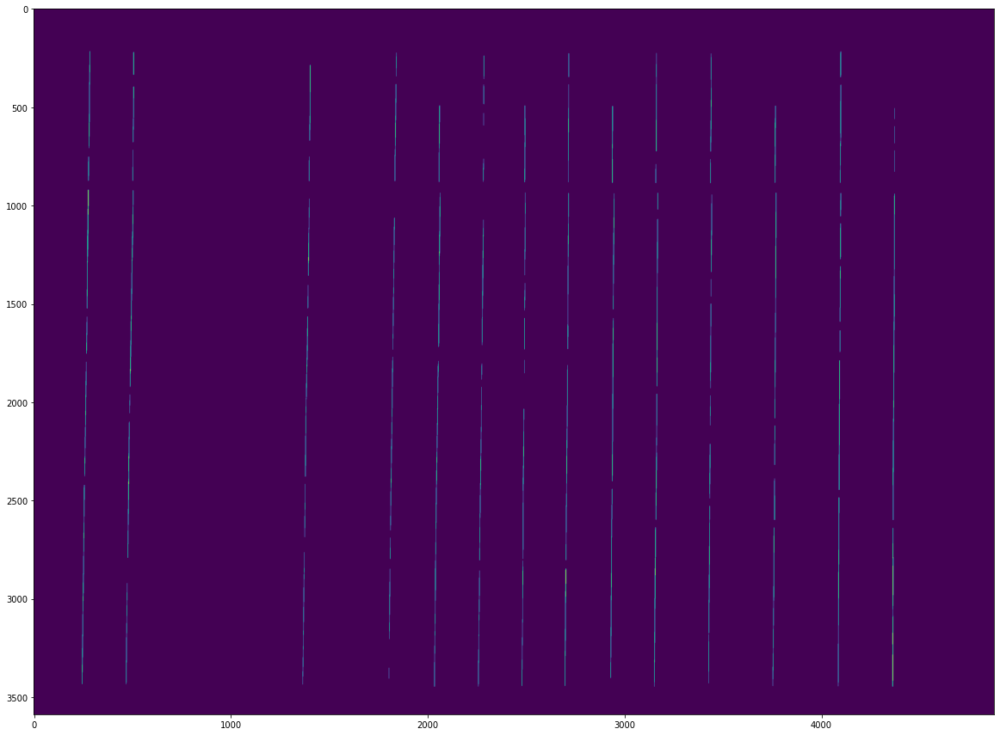

In [11]:
hor = np.array([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]])
# to detect vertical lines of table borders
img_temp1 = cv2.erode(th3, ver, iterations=5)
verticle_lines_img = cv2.dilate(img_temp1, ver, iterations=3)
# for ll in verticle_lines_img[1000]:
#     print(ll)
show_image(verticle_lines_img)

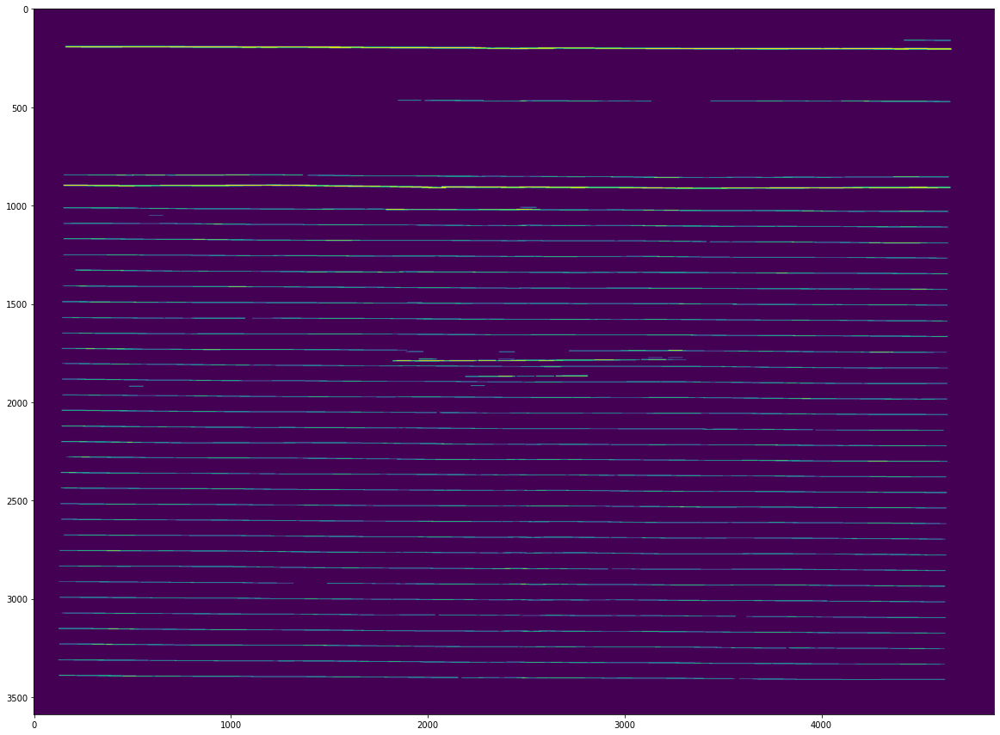

In [13]:
# to detect horizontal lines of table borders
img_hor = cv2.erode(th3, hor, iterations=3)
hor_lines_img = cv2.dilate(img_hor, hor, iterations=5)
show_image(hor_lines_img)

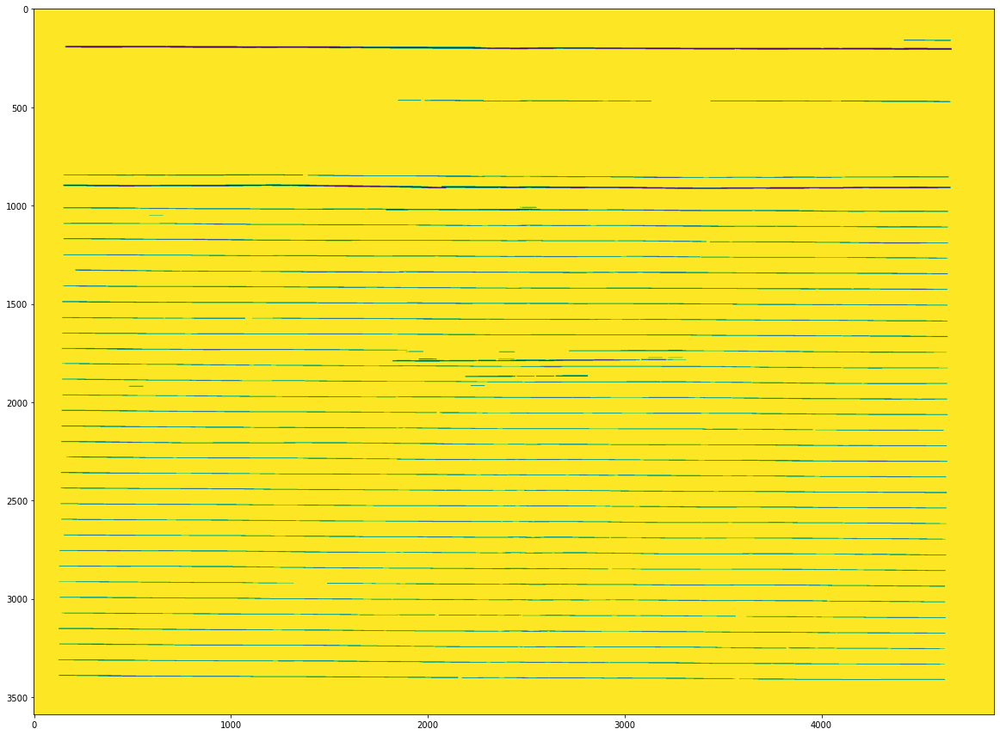

In [14]:
hor_lines_img_dack = 255 - hor_lines_img
show_image(hor_lines_img_dack)

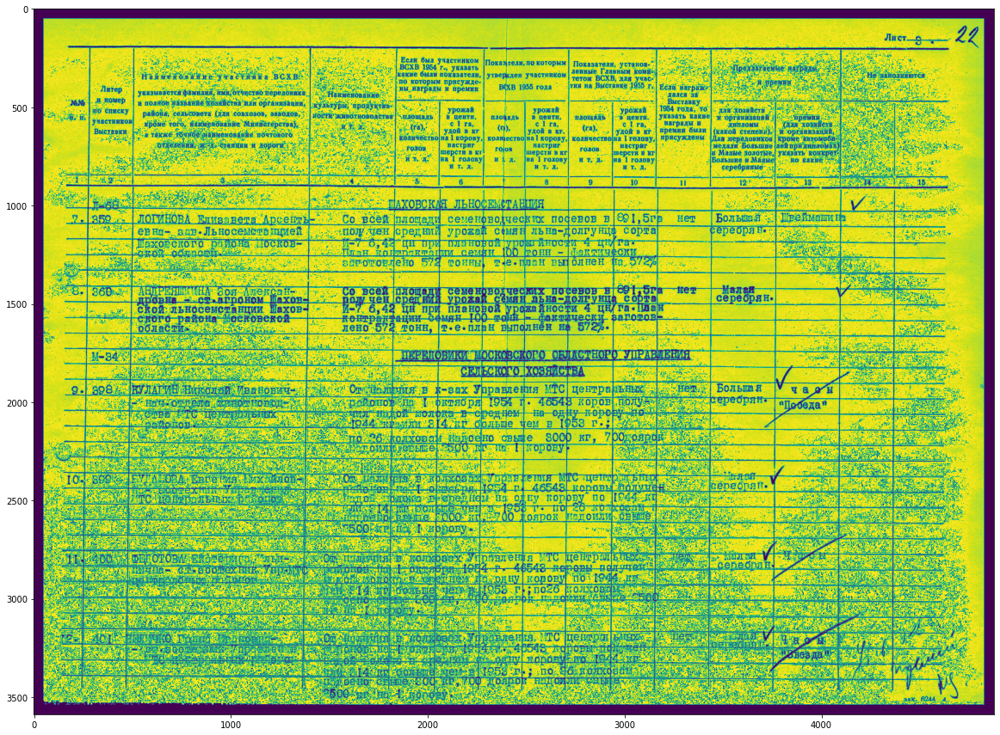

In [16]:
img2 = img1.copy() - hor_lines_img_dack
show_image(img2)

In [ ]:
# adding horizontal and vertical lines
hor_ver = cv2.add(hor_lines_img, verticle_lines_img)
hor_ver = 255 - hor_ver
show_image(hor_ver)

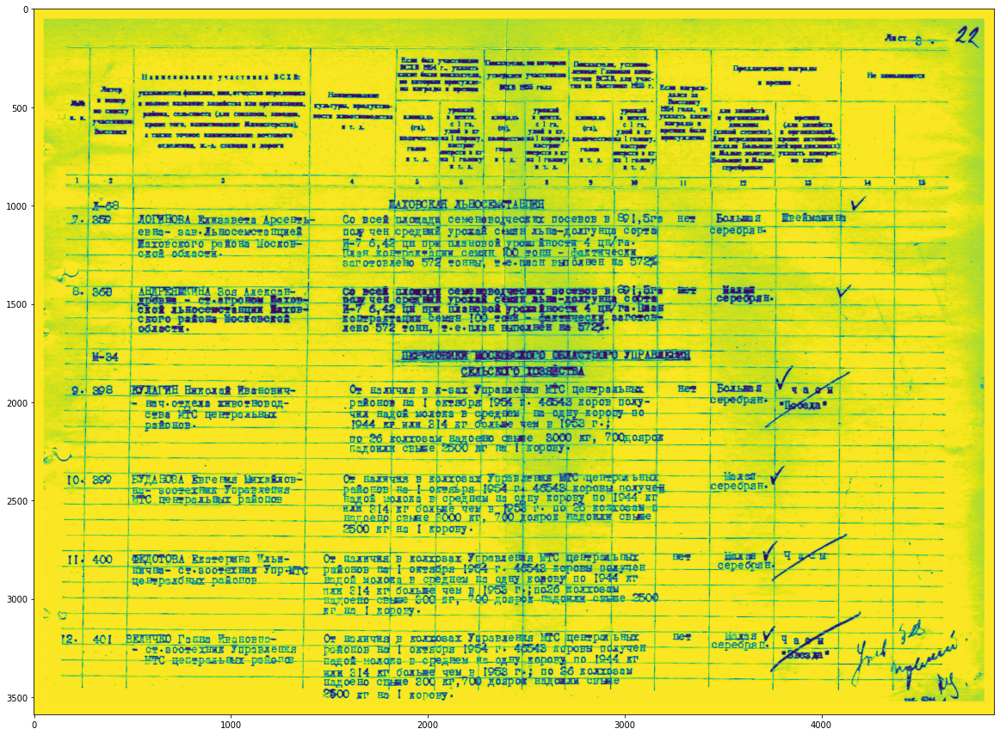

In [10]:
# subtracting table borders from image
temp = cv2.subtract(th3, hor_ver)
temp = 255 - temp
# Doing xor operation for erasing table boundaries
tt = cv2.bitwise_xor(img1, temp)
iii = cv2.bitwise_not(tt)
tt1 = iii.copy()
# kernel initialization
ver1 = np.array([[1, 1],
                 [1, 1],
                 [1, 1],
                 [1, 1],
                 [1, 1],
                 [1, 1],
                 [1, 1],
                 [1, 1],
                 [1, 1]])
hor1 = np.array([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
                 [1, 1, 1, 1, 1, 1, 1, 1, 1, 1]])
# morphological operation
temp1 = cv2.erode(tt1, ver1, iterations=1)
verticle_lines_img1 = cv2.dilate(temp1, ver1, iterations=1)
temp12 = cv2.erode(tt1, hor1, iterations=1)
hor_lines_img2 = cv2.dilate(temp12, hor1, iterations=1)
show_image(hor_lines_img2)

1963
Лі@ | 157 | 1033 | 236 | 74
ЫПЁЕВА | 476 | 1013 | 323 | 85
Е:п:в…ве-та | 835 | 1051 | 294 | 45
Ар-сенть—й | 1159 | 1021 | 279 | 77
Со | 1573 | 1048 | 58 | 44
всей | 1669 | 1021 | 128 | 71
площада | 1832 | 1039 | 230 | 70
сече | 2108 | 1057 | 126 | 32
во;че—съц | 2307 | 1025 | 288 | 77
по‹&е:всгв | 2634 | 1026 | 224 | 76
891, | 2943 | 1021 | 140 | 85
5гЭ | 3092 | 1021 | 107 | 85
ней-:;_ | 3272 | 1025 | 142 | 80
\Бсщьвя | 3444 | 1039 | 250 | 56
ЕЪЭЁЁЕЁ | 3801 | 1039 | 325 | 108
евна- | 533 | 1102 | 161 | 53
зав | 736 | 1122 | 117 | 32
Льносеыста | 841 | 1103 | 352 | 77
нцией | 1194 | 1103 | 162 | 77
пог | 1575 | 1119 | 103 | 42
чен | 1706 | 1118 | 100 | 34
средшё | 1831 | 1104 | 301 | 60
*Ёпч | 2343 | 1104 | 157 | 76
д:ьа—Ёш'увца | 2531 | 1102 | 432 | 78
сертщ | 3000 | 1105 | 173 | 62
серебря | 3436 | 1108 | 285 | 50
#5 | 3666 | 1095 | 62 | 67
Шаховского, | 522 | 1154 | 370 | 76
реЕо@ | 874 | 1176 | 269 | 50
Носков- | 1127 | 1171 | 273 | 45
н-7 | 1571 | 1168 | 92 | 46
6,48 | 1706 | 

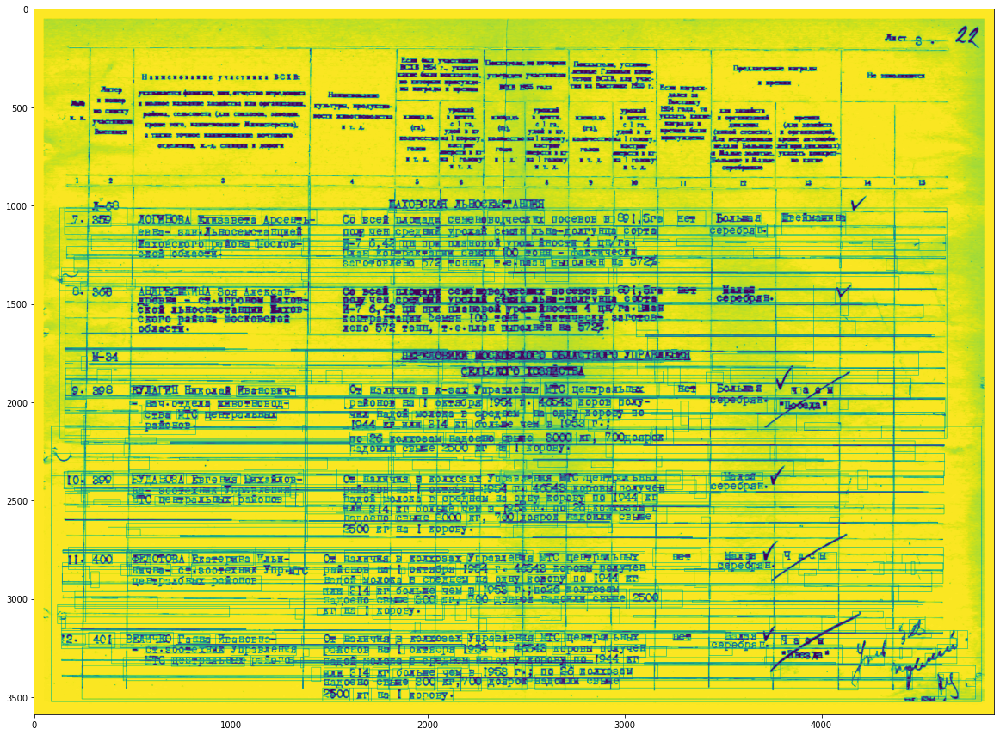

In [11]:
d = pytesseract.image_to_data(hor_lines_img2, output_type=pytesseract.Output.DICT, lang="rus")
n_boxes = len(d['level'])
print(n_boxes)
file_mistakes = open('file_mistakes2.txt','a')
hor_lines_img2_2 = hor_lines_img2.copy()
for i in range(400,n_boxes):
    (t, x, y, w, h) = (d['text'][i],d['left'][i], d['top'][i], d['width'][i], d['height'][i])    
    hor_lines_img2_2 = cv2.rectangle(hor_lines_img2_2, (x, y), (x + w, y + h), (0, 255, 0), 1)
    t = t.strip().replace('|','').replace('.','').replace('--','').replace('—-','').replace('”','')
    if len(t)>1 and len(t)< 15 and not t.isdigit():
        print(t, x, y, w, h, sep=' | ')
show_image(hor_lines_img2_2)